In [1]:
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')
import stereo as st
import os
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc

In [20]:
sample='Y01047K2'
time='9W'
num='3'
bin_size=20
resolution=1.2

In [3]:
data_path = f'K:/同仁医院人眼时空\\{sample}-{time}\\gef\\{sample}.tissue.gef'
data_path

'K:/同仁医院人眼时空\\Y01047K2-9W\\gef\\Y01047K2.tissue.gef'

In [4]:
# read GEF file in CGEF
# data_path = '../data/SS200000135TL_D1.cellbin.gef'
# data = st.io.read_gef(data_path, bin_type='cell_bins')

# read GEF file in BGEF
data_path = f'K:/同仁医院人眼时空\\{sample}-{time}\\gef\\{sample}.cellbin.gef'
#data = st.io.read_gef(data_path, bin_type='bins', bin_size=50)
data = st.io.read_gef(file_path=data_path,  bin_type='cell_bins', gene_name_index=True)

data.tl.cal_qc()

[2025-03-21 14:20:43][Stereo][29500][MainThread][4964][reader][1303][INFO]: read_gef begin ...
[2025-03-21 14:27:06][Stereo][29500][MainThread][4964][reader][1518][INFO]: This is GEF file which contains cell bin infomation.
[2025-03-21 14:27:06][Stereo][29500][MainThread][4964][reader][1519][INFO]: bin_type: cell_bins
[2025-03-21 14:27:06][Stereo][29500][MainThread][4964][reader][1525][INFO]: Number of cells: 300627
[2025-03-21 14:27:06][Stereo][29500][MainThread][4964][reader][1528][INFO]: Number of gene: 52365
[2025-03-21 14:27:06][Stereo][29500][MainThread][4964][reader][1531][INFO]: Resolution: 500
[2025-03-21 14:27:06][Stereo][29500][MainThread][4964][reader][1534][INFO]: offsetX: 0
[2025-03-21 14:27:06][Stereo][29500][MainThread][4964][reader][1537][INFO]: offsetY: 0
[2025-03-21 14:27:06][Stereo][29500][MainThread][4964][reader][1540][INFO]: Average number of genes: 99.89488983154297
[2025-03-21 14:27:06][Stereo][29500][MainThread][4964][reader][1543][INFO]: Maximum number of gen

In [8]:
ins = data.plt.interact_spatial_scatter(width=1000, height=1000, poly_select=False)
ins.show()

Column
    [0] Row
        [0] Select(name='color theme', options=OrderedDict([('CET_C1', ...]), value=['#0c3383', '#0c3484', ...], width=200)
        [1] Checkbox(name='reverse_colormap')
    [1] Row
        [0] ParamFunction(function, _pane=HoloViews)
        [1] Column
            [0] Column
                [0] Markdown(str)
                [1] Row
                    [0] Select(options={'keep selected areas': Fa...}, value=False, width=150)
                    [1] Button(button_type='primary', name='export', width=100)
                [2] StaticText(height=20, sizing_mode='fixed', width=300)

In [9]:
selected_exp_data = ins.selected_exp_data
selected_exp_data

StereoExpData object with n_cells X n_genes = 10881 X 29427
bin_type: cell_bins
offset_x = None
offset_y = None
cells: ['cell_name', 'dnbCount', 'area', 'total_counts', 'n_genes_by_counts', 'pct_counts_mt']
genes: ['gene_name', 'n_cells', 'n_counts', 'mean_umi']
cells_matrix = ['cell_border', 'spatial']
Layers with keys: 
tl.result: []

[2025-03-21 14:42:09][Stereo][29500][MainThread][4964][st_pipeline][41][INFO]: start to run cal_qc...
[2025-03-21 14:42:09][Stereo][29500][MainThread][4964][st_pipeline][44][INFO]: cal_qc end, consume time 0.0517s.


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

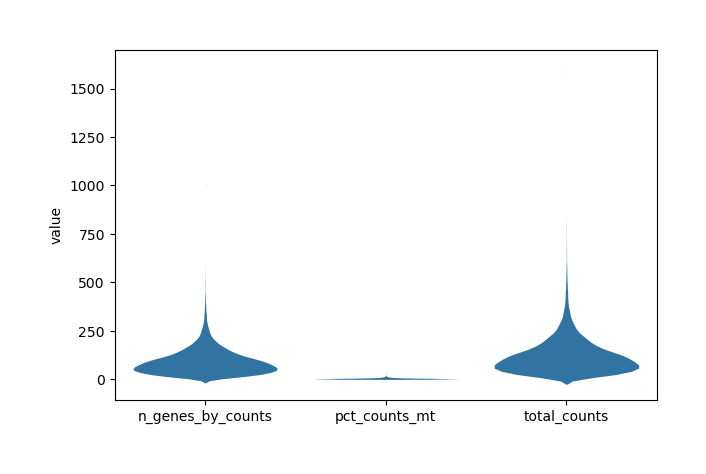

In [12]:

selected_exp_data.tl.cal_qc()
selected_exp_data.plt.violin()#

In [14]:
#保留原始数据，强烈建议使用 self.raw 来记录经过基本处理的原始基因表达矩阵，作为后续差异测试和多重分析的基本数据集。
selected_exp_data.tl.raw_checkpoint()
selected_exp_data.tl.raw
#When you want to get raw data, just run data.tl.reset_raw_data()

StereoExpData object with n_cells X n_genes = 10881 X 29427
bin_type: cell_bins
offset_x = None
offset_y = None
cells: ['cell_name', 'dnbCount', 'area', 'total_counts', 'n_genes_by_counts', 'pct_counts_mt']
genes: ['gene_name', 'n_cells', 'n_counts', 'mean_umi']
cells_matrix = ['cell_border', 'spatial']
Layers with keys: 
tl.result: []

[2025-03-21 14:43:06][Stereo][29500][MainThread][4964][st_pipeline][41][INFO]: start to run normalize_total...
[2025-03-21 14:43:06][Stereo][29500][MainThread][4964][st_pipeline][44][INFO]: normalize_total end, consume time 0.0200s.
[2025-03-21 14:43:06][Stereo][29500][MainThread][4964][st_pipeline][41][INFO]: start to run log1p...
[2025-03-21 14:43:06][Stereo][29500][MainThread][4964][st_pipeline][44][INFO]: log1p end, consume time 0.0132s.
[2025-03-21 14:43:06][Stereo][29500][MainThread][4964][st_pipeline][41][INFO]: start to run highly_variable_genes...
[2025-03-21 14:43:07][Stereo][29500][MainThread][4964][st_pipeline][44][INFO]: highly_variable_genes end, consume time 0.6381s.
[2025-03-21 14:43:07][Stereo][29500][MainThread][4964][st_pipeline][41][INFO]: start to run scale...
[2025-03-21 14:43:08][Stereo][29500][MainThread][4964][scale][53][INFO]: Truncate at max_value 10
[2025-03-21 14:43:08][Stereo][29500][MainThread][4964][st_pipeline][44][INFO]: scale end, consume time 1.8443s

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

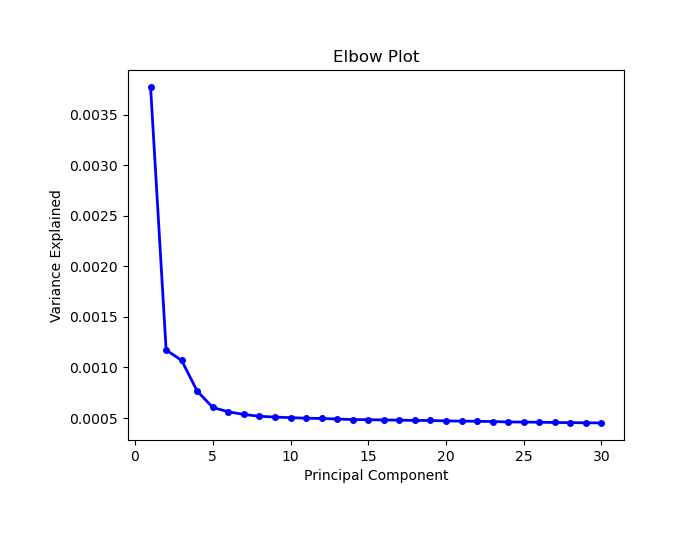

In [15]:
#标准化
selected_exp_data.tl.normalize_total(target_sum=10000)
selected_exp_data.tl.log1p()
#找高变基因
selected_exp_data.tl.highly_variable_genes(
        min_mean=0.0125,
        max_mean=3,
        min_disp=0.5,
        n_top_genes=2000,
        res_key='highly_variable_genes'
        )
#用方差标准化
selected_exp_data.tl.scale(max_value=10, zero_center=True)
#降维，嵌入
selected_exp_data.tl.pca(
        use_highly_genes=False,
        n_pcs=30,
        res_key='pca'
        )

selected_exp_data.tl.key_record#检查保存的key
selected_exp_data.plt.elbow(pca_res_key='pca')#画肘部图

In [16]:
#找邻居
selected_exp_data.tl.neighbors(
        pca_res_key='pca',
        n_pcs=30,
        res_key='neighbors'
        )

# compute spatial neighbors
selected_exp_data.tl.spatial_neighbors(
        neighbors_res_key='neighbors',
        res_key='spatial_neighbors'
        )
#UMAP
selected_exp_data.tl.umap(pca_res_key='pca', neighbors_res_key='neighbors', res_key='umap')

[2025-03-21 14:44:39][Stereo][29500][MainThread][4964][st_pipeline][41][INFO]: start to run neighbors...
[2025-03-21 14:44:55][Stereo][29500][MainThread][4964][st_pipeline][44][INFO]: neighbors end, consume time 16.7520s.
[2025-03-21 14:44:55][Stereo][29500][MainThread][4964][st_pipeline][41][INFO]: start to run spatial_neighbors...
[2025-03-21 14:44:57][Stereo][29500][MainThread][4964][reader][940][INFO]: Adding sample in adata.obs['orig.ident'].
[2025-03-21 14:44:57][Stereo][29500][MainThread][4964][reader][943][INFO]: Adding data.position as adata.obsm['spatial'] .
[2025-03-21 14:44:57][Stereo][29500][MainThread][4964][reader][948][INFO]: Adding data.position as adata.obs['x'] and adata.obs['y'] .
[2025-03-21 14:44:57][Stereo][29500][MainThread][4964][reader][988][INFO]: Adding data.tl.result['highly_variable_genes'] into adata.var .
[2025-03-21 14:44:57][Stereo][29500][MainThread][4964][reader][1031][INFO]: Adding data.tl.result['pca'] into adata.obsm['X_pca'] .
[2025-03-21 14:44:5

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs


[2025-03-21 14:45:01][Stereo][29500][MainThread][4964][st_pipeline][44][INFO]: umap end, consume time 3.8554s.


In [21]:
selected_exp_data.tl.leiden(neighbors_res_key='neighbors',resolution=resolution, res_key='leiden')
selected_exp_data.tl.find_marker_genes(
        cluster_res_key='leiden',
        method='t_test',
        use_highly_genes=False,
        use_raw=True
        )

[2025-03-21 16:08:38][Stereo][29500][MainThread][4964][st_pipeline][41][INFO]: start to run leiden...
[2025-03-21 16:08:38][Stereo][29500][MainThread][4964][st_pipeline][44][INFO]: leiden end, consume time 0.9174s.
[2025-03-21 16:08:38][Stereo][29500][MainThread][4964][st_pipeline][41][INFO]: start to run find_marker_genes...
[2025-03-21 16:08:39][Stereo][29500][MainThread][4964][tool_base][122][INFO]: read group information, grouping by group column.
[2025-03-21 16:08:39][Stereo][29500][MainThread][4964][tool_base][151][INFO]: start to run...
[2025-03-21 16:08:39][Stereo][29500][MainThread][4964][tool_base][153][INFO]: end to run.
[2025-03-21 16:08:39][Stereo][29500][MainThread][4964][st_pipeline][44][INFO]: find_marker_genes end, consume time 0.5360s.


In [22]:
adata = st.io.stereo_to_anndata(selected_exp_data,flavor='scanpy')

[2025-03-21 16:08:42][Stereo][29500][MainThread][4964][reader][940][INFO]: Adding sample in adata.obs['orig.ident'].
[2025-03-21 16:08:42][Stereo][29500][MainThread][4964][reader][943][INFO]: Adding data.position as adata.obsm['spatial'] .
[2025-03-21 16:08:42][Stereo][29500][MainThread][4964][reader][948][INFO]: Adding data.position as adata.obs['x'] and adata.obs['y'] .
[2025-03-21 16:08:42][Stereo][29500][MainThread][4964][reader][988][INFO]: Adding data.tl.result['highly_variable_genes'] into adata.var .
[2025-03-21 16:08:42][Stereo][29500][MainThread][4964][reader][1031][INFO]: Adding data.tl.result['pca'] into adata.obsm['X_pca'] .
[2025-03-21 16:08:42][Stereo][29500][MainThread][4964][reader][1036][INFO]: Adding data.tl.result['pca_variance_ratio'] into adata.uns['pca_variance_ratio'] .
[2025-03-21 16:08:42][Stereo][29500][MainThread][4964][reader][1044][INFO]: Adding data.tl.result['neighbors']['connectivities'] into adata.obsp['connectivities'] .
[2025-03-21 16:08:42][Stereo][

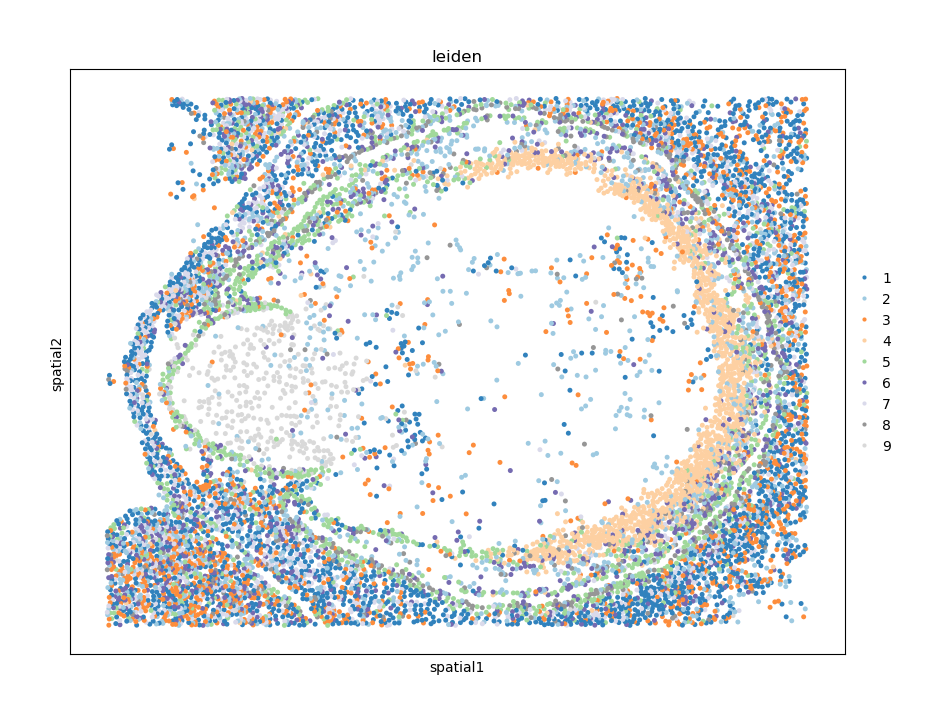

In [25]:
plt.rcParams["figure.figsize"] = (10, 10)
sc.pl.spatial(adata, color=["leiden"],spot_size=50, size=0.5,palette='tab20c')

In [ ]:
adata.write(f"./{samplename}.h5ad")